In [16]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

from matplotlib import cm
import matplotlib.colors

from matplotlib import animation, rc
from IPython.display import HTML

import numpy as np

In [26]:
class SingleSigmoidNeuron():
    
    def __init__(self, w_init, b_init, algo):
        
        self.w = w_init
        self.b = b_init
        self.algo = algo
        
        self.w_h = []
        self.b_h = []
        self.e_h = []
    
    def sigmoid(self, x, w=None, b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        
        return 1. / (1. + np.exp( -(w * x + b)))
    
    def calculate_error(self, X, Y, w=None, b=None):
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        error = 0
        
        for x,y in zip(X,Y):
            error += 0.5 * ((self.sigmoid(x, w, b) - y ) ** 2)
        
        return error
            
    def grad_w(self, x, y, w=None, b=None): 
        # calculate gradient according to Mean Square Error loss function with a single neuron
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        y_pred = self.sigmoid(x, w, b)
        
        return (y_pred - y) * y_pred * (1 - y_pred) * x
            
    def grad_b(self, x, y, w=None, b=None):
        # calculate gradient according to Mean Square Error loss function with a single neuron
        if w is None:
            w = self.w
        if b is None:
            b = self.b
        y_pred = self.sigmoid(x, w, b)
        
        return (y_pred - y) * y_pred * (1 - y_pred)
    
    def append_log(self):
        self.w_h.append(self.w)
        self.b_h.append(self.b)
        self.e_h.append(self.calculate_error(self.X, self.Y))
    
    def fit(self, X, Y, epochs=100, eta=0.01, gamma=0.9, mini_batch_size=100,
            epsilon=1e-8, beta=0.9, beta1=0.9, beta2=0.9):
        
        self.w_h = []
        self.b_h = []
        self.e_h = []
        self.X = X
        self.Y = Y
        
        if self.algo == 'GD':
            for _ in range(epochs):
                dw = 0
                db = 0
                for x,y in zip(X, Y):
                    dw += self.grad_w(x, y)
                    db += self.grad_b(x, y)
                self.w -= eta * dw / X.shape[0]
                self.b -= eta * db / X.shape[0]
                self.append_log() # save intermediate weight, bias and error values after each epoch

In [45]:
X = np.asarray([0.5, 2.5])
Y = np.asarray([0.2, 0.9])

algo = 'GD'

# w_init = -2
# b_init = -2

w_init = -3
b_init = 4

# w_init = -5
# b_init = 4

epochs = 1000 
eta = 1

w_min = -7
w_max = 5
b_min = -5
b_max = 5

animation_frames = 20
plot_3d = True
plot_2d = False

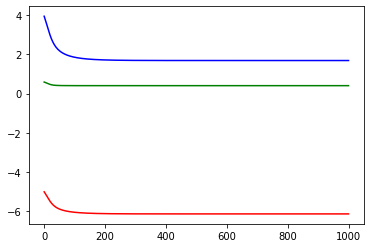

In [46]:
sn = SingleSigmoidNeuron(w_init, b_init, algo)
sn.fit(X, Y, epochs=epochs, eta=eta)
plt.plot(sn.w_h, 'r')
plt.plot(sn.b_h, 'b')
plt.plot(sn.e_h, 'g')
plt.show()

In [47]:
def plot_animate_3d(i):
    i = int(i * (epochs/animation_frames))
    
    line1.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
    line2.set_data(sn.w_h[:i+1], sn.b_h[:i+1])
    
    line1.set_3d_properties(sn.e_h[:i+1])
    line2.set_3d_properties(np.zeros(i+1) - 1)
    
    title.set_text('Epoch : {}, error = {:.4f}'.format(i, sn.e_h[i]))
    
    return line1, line2, title

error values shape :  (256, 256)


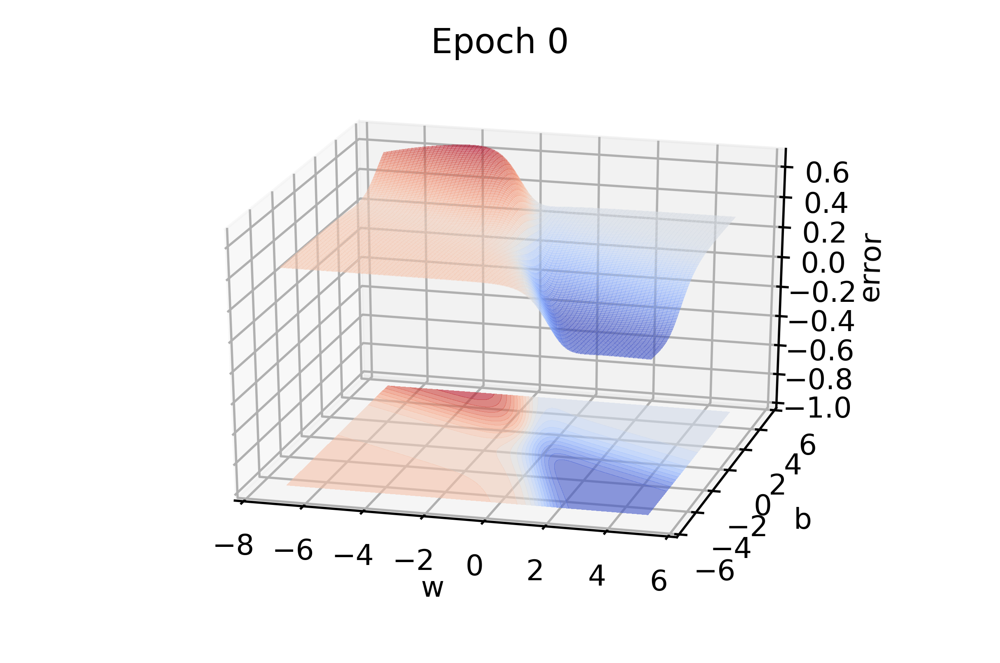

In [48]:
# Plot 3d surface and contour plot

if plot_3d :
    W = np.linspace(w_min, w_max, 256) 
# create an array(size=256) with linearly spaced values starting from w_min and ending at w_max, including both
    B = np.linspace(b_min, b_max, 256)
    WW, BB = np.meshgrid(W, B) 
    Z = sn.calculate_error(X, Y, WW, BB) # find error for all combinations of weights and biases(256x256)
    print("error values shape : ", Z.shape)
    
    fig = plt.figure(dpi=500)
    ax = fig.gca(projection='3d')
    surface = ax.plot_surface(WW, BB, Z, rstride=3, cstride=3, alpha=0.5, cmap=cm.coolwarm,
                              linewidth=0, antialiased=False)
    contour_plt = ax.contourf(WW, BB, Z, 25, zdir='z', offset=-1, alpha=0.6, cmap=cm.coolwarm)
    
    ax.set_xlabel('w')
    ax.set_ylabel('b')
    ax.set_zlabel('error')
    
    ax.set_xlim(w_min - 1, w_max + 1)
    ax.set_ylim(b_min - 1, b_max + 1)
    ax.set_zlim(-1, np.max(Z))
    
    ax.view_init(elev=25, azim=-75)
    ax.dist=12
    title = ax.set_title('Epoch 0')

In [50]:
if plot_3d:
    i = 0
    line1, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], sn.e_h[:i+1], color='black', marker='.')
    line2, = ax.plot(sn.w_h[:i+1], sn.b_h[:i+1], np.zeros(i+1)-1, color='red', marker='.')
    anim = animation.FuncAnimation(fig, func=plot_animate_3d, frames=animation_frames)
    rc('animation', html='jshtml')
    anim

In [51]:
if algo == 'GD':
    print("algo = {},eta = {}".format(algo, eta))
anim

algo = GD,eta = 1


In [43]:
a = np.linspace(0, 1, 3) 
b = np.linspace(0, 1, 10)``x`x
c,d = np.meshgrid(a, b)
print("c shape = {}, d shape = {}".format(c.shape, d.shape))

c shape = (10, 3), d shape = (10, 3)
